In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import umap
import plotly.express as px
import plotly.graph_objects as go

import umap
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from os.path import join as oj
from sklearn.mixture import BayesianGaussianMixture
from sklearn.ensemble import RandomForestClassifier

from get_pose_mat_wide import get_pose_mat_wide

In [2]:
animal = 'RRM026'
session = 'Day176'
root_folder = r'/Users/yang/Documents/Wilbrecht_Lab/data4analysis/processed_tracks'

'''
# following code block is used to extract assigned animal and session
animal_folder = oj(root_folder, animal)

dataframes = []

# Check if the animal folder exists
if os.path.isdir(animal_folder):
    session_folder = oj(animal_folder, session)
    if os.path.isdir(session_folder):
        for filename in os.listdir(session_folder):
            if filename.startswith(f'{animal}_{session}') and filename.endswith('tracks_processed.csv'):
                file_path = oj(session_folder, filename)
                df = pd.read_csv(file_path, index_col=False)
                dataframes.append(df)
    else:
        print('No matching session folder found.')
else:
    print('No matching animal folder found.')

if dataframes:
    combined_df = pd.concat(dataframes, ignore_index=True)
else:
    print("No matching files found.")
    '''


'\n# following code block is used to extract assigned animal and session\nanimal_folder = oj(root_folder, animal)\n\ndataframes = []\n\n# Check if the animal folder exists\nif os.path.isdir(animal_folder):\n    session_folder = oj(animal_folder, session)\n    if os.path.isdir(session_folder):\n        for filename in os.listdir(session_folder):\n            if filename.startswith(f\'{animal}_{session}\') and filename.endswith(\'tracks_processed.csv\'):\n                file_path = oj(session_folder, filename)\n                df = pd.read_csv(file_path, index_col=False)\n                dataframes.append(df)\n    else:\n        print(\'No matching session folder found.\')\nelse:\n    print(\'No matching animal folder found.\')\n\nif dataframes:\n    combined_df = pd.concat(dataframes, ignore_index=True)\nelse:\n    print("No matching files found.")\n    '

In [3]:
combined_df = pd.read_csv(oj(root_folder, 'combined_df.csv'), index_col=False)

In [4]:
print(combined_df.shape)
combined_df.head()


(1643207, 39)


,Unnamed: 0,Head x,Head y,Neck x,Neck y,Torso x,Torso y,Tailhead x,Tailhead y,warped Head x,warped Head y,warped Neck x,warped Neck y,warped Torso x,warped Torso y,warped Tailhead x,warped Tailhead y,time,idx,label,rel_time,restaurant,lapIndex,trial,decision,Head displacement,Neck displacement,Torso displacement,Tailhead displacement,Head velocity,Neck velocity,Torso velocity,Tailhead velocity,Head acceleration,Neck acceleration,Torso acceleration,Tailhead acceleration,animal,session
0,0,192.796951,28.332069,195.778046,23.389879,199.605362,11.785733,203.450699,6.817648,273.703649,130.625305,270.851829,135.363557,267.334004,146.804269,263.640601,150.742375,44.000269,1319,tone_onset,0.025318,4.0,0.0,4.0,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6649.885821,4646.693069,4412.589343,590.246091,RRM028,Day141
1,1,192.110931,35.688915,195.196640,28.520031,199.130478,16.665558,203.038986,7.328142,274.235963,124.023690,272.033065,130.498613,267.832977,140.655464,264.869217,150.032891,44.033421,1320,tone_onset,0.058470,4.0,0.0,4.0,NaN,7.388762,5.162992,4.902877,0.655829,221.662861,154.889769,147.086311,19.674870,312.597565,2818.161807,3099.677421,4895.582548,RRM028,Day141
2,2,191.869446,43.421238,192.651031,36.414017,196.267807,24.506279,199.963287,12.590609,274.606919,117.536312,273.197755,123.399189,270.498303,134.165439,266.377924,145.293412,44.067584,1321,tone_onset,0.092634,4.0,0.0,4.0,NaN,7.736093,8.294283,8.346963,6.095365,232.082780,248.828496,250.408892,182.860955,-2067.092682,-755.839578,-671.529336,1497.167579,RRM028,Day141
3,3,191.725861,48.858665,192.430756,43.865223,195.759293,32.090069,199.434418,20.331448,275.048460,111.118353,274.164603,116.417777,271.070006,127.330397,267.452805,138.269698,44.101210,1322,tone_onset,0.126259,4.0,0.0,4.0,NaN,5.439323,7.454461,7.600819,7.758885,163.179690,223.633843,228.024581,232.766541,2402.980104,552.449666,-58.973204,-460.739103,RRM028,Day141
4,4,191.152802,56.947693,191.896271,51.915794,195.551804,39.622505,199.436478,27.578400,276.035795,104.365713,275.029836,109.093630,271.373536,120.277504,268.452345,131.491643,44.133939,1323,tone_onset,0.158989,4.0,0.0,4.0,NaN,8.109301,8.068294,7.535294,7.246952,243.279027,242.048832,226.058807,217.408570,-1.766716,-338.857171,218.826253,883.502202,RRM028,Day141


### over 92% trial length is greater than 37 frames (~1 second). also, most straight walking length is less than 30 frames. then we use the first 37 frames to cluster the trajectories.

In [11]:
frames_preserved=32
result_df = get_pose_mat_wide(combined_df, frames_preserved)
result_df.head()

,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,x18,y18,x19,y19,x20,y20,x21,y21,x22,y22,x23,y23,x24,y24,x25,y25,x26,y26,x27,y27,x28,y28,x29,y29,x30,y30,x31,y31,x32,y32,sleap_decision,bonsai_decision,straight_walking_speed,animal,session,trial,restaurant,trial_length
0,273.703649,130.625305,274.235963,124.023690,274.606919,117.536312,275.048460,111.118353,276.035795,104.365713,277.457621,97.306999,278.271191,90.163659,278.769569,83.212717,279.924639,76.687224,282.226226,70.526040,284.730044,64.460354,286.347218,58.776239,287.613997,54.010870,289.272027,50.212979,291.041227,47.274656,292.915235,45.106264,294.470890,43.429390,295.890055,42.174165,296.612581,40.990125,296.835308,39.673758,297.118807,38.450471,297.968651,37.297239,299.522459,36.182748,301.183006,35.425681,303.142388,35.002820,305.081545,34.739655,307.206128,34.535209,309.299775,34.442155,311.987880,34.523925,314.901035,34.805050,317.230943,35.331967,318.327077,36.190294,ACC,ACC,188.774688,RRM028,Day141,4.0,4.0,59
1,278.505831,127.307328,278.338044,121.500514,278.484608,115.894415,278.881790,109.548623,279.126810,102.518210,279.152716,95.606381,279.676415,89.327767,281.385953,82.908667,282.536821,76.223839,282.960502,70.008193,283.109450,65.014807,283.767394,60.611696,285.400073,55.937098,286.407122,51.016905,285.977186,46.911997,283.549606,43.975968,280.613581,42.001240,278.380364,40.108345,274.981041,38.240089,270.108010,36.270813,264.958268,34.564278,259.284335,32.848805,253.904647,31.269513,247.614585,29.566278,240.565820,28.300840,233.259745,27.394696,225.966237,26.517452,218.788305,26.100694,211.171446,25.901581,202.564781,25.736316,194.678252,25.670207,188.109918,25.714964,REJ,REJ,190.417145,RRM028,Day141,8.0,4.0,33
2,275.081359,131.457371,276.551920,125.745898,277.920257,119.725813,279.353280,113.663796,280.992563,107.857920,282.703152,102.117335,284.263311,96.332890,285.395786,90.338958,286.141420,84.376595,286.752522,78.650797,287.424913,72.890737,288.076108,67.150784,288.429964,61.632167,288.590266,56.818179,288.827450,52.719948,288.879932,49.043283,288.487870,45.624969,287.734175,42.464258,287.181012,39.737953,287.328540,37.603476,288.484967,36.057915,290.654320,35.278414,293.369887,35.087814,296.025750,35.178850,298.193430,35.323971,299.799126,35.368287,300.828446,35.253380,301.528409,35.043044,302.241186,34.921154,303.172702,35.064800,304.270177,35.541190,305.582506,36.353693,ACC,ACC,186.188321,RRM028,Day141,12.0,4.0,64
3,277.941905,130.312508,278.577533,123.949534,278.881523,117.752173,279.415347,112.051546,280.815795,106.384137,282.043548,100.558081,283.358481,94.048189,284.900140,87.281708,285.668812,81.073493,286.700323,75.899670,288.455831,70.886647,289.370524,65.524698,289.478691,60.225681,289.380885,55.099283,289.664211,50.758991,290.242585,47.050286,290.524720,43.996443,289.496212,41.728743,286.627191,39.667693,283.122585,38.016293,280.265608,36.730646,278.238777,36.209266,275.559139,36.053271,272.403964,35.614033,269.118122,34.569838,265.736166,33.219319,262.258284,32.581183,258.573566,32.523410,254.217363,32.610398,248.878605,32.542591,243.577473,32.263731,238.016960,32.007047,REJ,REJ,184.343255,RRM028,Day141,16.0,4.0,43
4,274.492893,135.458966,273.985886,135.097281,273.146888,134.716506,271.940633,134.231358,270.906057,133.488431,269.734629,132.513886,268.222932,131.953599,267.177602,131.725027,266.802420,131.468446,266.769480,131.052972,266.831641,130.283093,266.931097,129.064189,267.271795,127.901172,268.160689,126.543617,269.523188,124.742618,270.521648,122.766865,271.134587,120.320518,271.675395,117.829602,272.465213,115.761303,273.609600,114.056143,274.101834,113.168013,273.602910,112.952681,272.390351,113.021895,271.513807,113.067997,271.066324,112.955356,270.799461,112.514778,270.618663,111.503241,270.491087,109.908780,269.979903,108.239603,268.914055,106.674095,268.111367,105.665314,267.699462,105.024841,REJ,quit,61.098888,RRM028,Day141,20.0,4.0,206


(array([  41.,  236.,  374.,  705., 1755., 3165., 3487., 2005.,  475.,
          20.]),
 array([  0.        ,  29.16079608,  58.32159216,  87.48238824,
        116.64318432, 145.8039804 , 174.96477648, 204.12557256,
        233.28636864, 262.44716472, 291.6079608 ]),
 <BarContainer object of 10 artists>)

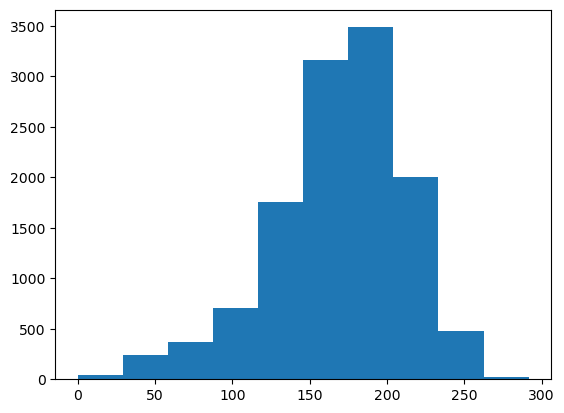

In [12]:
plt.hist(result_df['straight_walking_speed'])

In [13]:
# Define the histogram
fig = px.histogram(result_df, x='trial_length', color='sleap_decision',
                   title='Distribution of Trial Lengths by Decision',
                   labels={'trial_length': 'Number of Frames per Trial'},
                   nbins=2000,  # Set number of bins
                   opacity=0.5)  # Set opacity for overlapping

# Customize layout
fig.update_layout(
    xaxis_title='Number of Frames per Trial',
    yaxis_title='Frequency',
    bargap=0.1,
    legend_title='sleap_decision',
    template='plotly_white',
)
fig.update_xaxes(range=[0, 2000])
# Show the figure
fig.show()


In [14]:
decision_palette_dict = {
    "ACC": (0, 1, 0),  # Green with transparency
    "REJ": (1, 0, 0),  # Red with transparency
    "quit": (0, 0, 1),  # Blue with transparency
    "T-Entry": (1, 1, 1), # black
    np.nan: (1, 1, 1) # black
}
fig = go.Figure()
for index, row in result_df[:5000].iterrows():
    x_coords = [row[f'x{i}'] for i in range(1, frames_preserved)]
    y_coords = [row[f'y{i}'] for i in range(1, frames_preserved)]
    # Extract animal, session, and trial information
    decision, animal, session, trial = row['sleap_decision'], row['animal'], row['session'], row['trial']
    # Determine the color for the current trial
    color = 'rgba' + str(tuple(int(c * 255) for c in decision_palette_dict[decision]) + (0.2,))
    fig.add_trace(go.Scatter(
        x=x_coords, y=y_coords,
        mode='lines',
        name=f'Trial {row["trial"]}',
        line=dict(color=color, width=0.5),
    ))

fig.update_layout(
    title='Coordinates of Each Trial',
    xaxis_title='X Coordinates',
    yaxis_title='Y Coordinates',
    yaxis=dict(autorange='reversed'),
    showlegend=False,
)

fig.show()

In [15]:
# Define the trajectory columns
umap_columns = [f'x{i}' for i in range(1, frames_preserved)] + [f'y{i}' for i in range(1, frames_preserved)]

# Extract the coordinate data
coords_data = result_df[umap_columns]

n_components = 5
n_clusters = 5

# Perform UMAP
reducer = umap.UMAP(n_components=n_components, random_state=42)
umap_components = reducer.fit_transform(coords_data)

# Create a DataFrame for the UMAP components
umap_columns = [f'UMAP{i+1}' for i in range(n_components)]
umap_df = pd.DataFrame(umap_components, columns=umap_columns)

# Add the UMAP components to the original DataFrame
coords_umap = pd.concat([result_df.reset_index(drop=True), umap_df.reset_index(drop=True)], axis=1)

# Scatter plot of UMAP1 and UMAP2 with decisions using Plotly
fig = px.scatter(coords_umap, x='UMAP1', y='UMAP2', color='sleap_decision',
                 title='Scatter Plot of UMAP1 and UMAP2 with Decision Distributions',
                 labels={'UMAP1': 'UMAP1', 'UMAP2': 'UMAP2'},
                 hover_data=['sleap_decision'])
fig.update_traces(marker=dict(size=2))
fig.show()

/opt/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



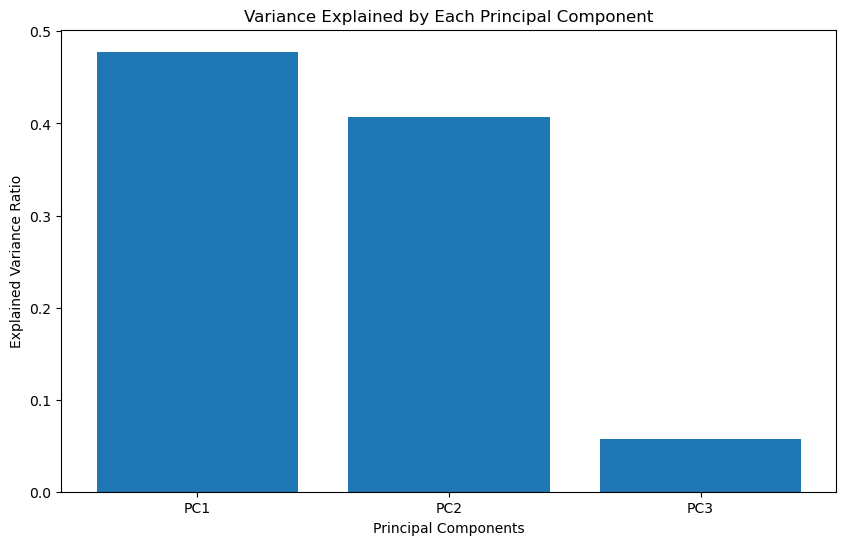

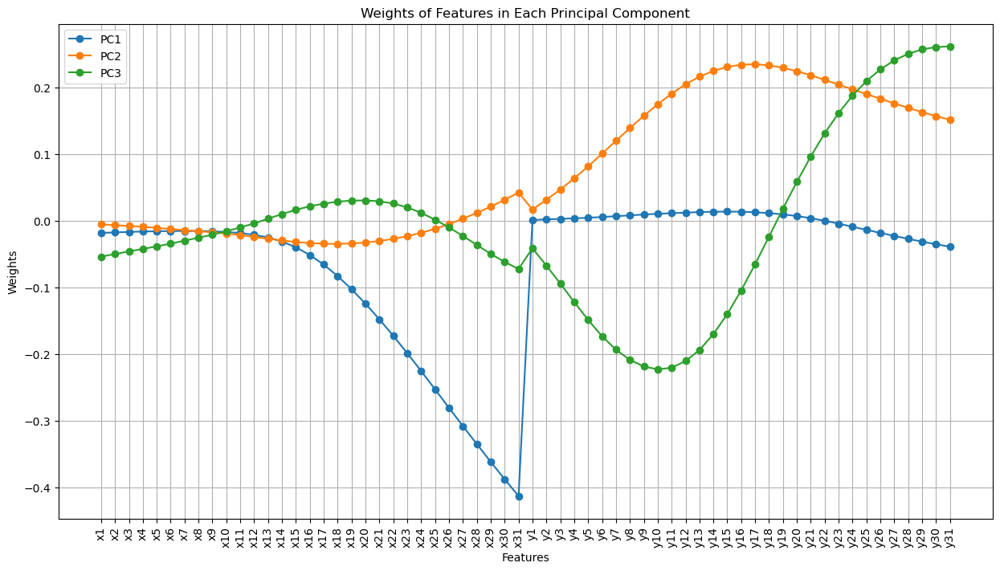

In [16]:
# Define the trajectory columns
pca_columns = [f'x{i}' for i in range(1, frames_preserved)] + [f'y{i}' for i in range(1, frames_preserved)]

# Extract the coordinate data
coords_data = result_df[pca_columns]

# Perform PCA
n_components = 3
pca = PCA(n_components=n_components)
principal_components = pca.fit_transform(coords_data)

# Create a DataFrame for the principal components
pc_columns = [f'PC{i+1}' for i in range(n_components)]
pc_df = pd.DataFrame(principal_components, columns=pc_columns)

# Add the principal components to the original DataFrame
speed_pca = pd.concat([result_df.reset_index(drop=True), pc_df.reset_index(drop=True)], axis=1)

# Scatter plot of PC1 and PC2 with decisions using Plotly
fig = px.scatter(speed_pca, x='PC1', y='PC2', color='sleap_decision',
                 title='Scatter Plot of PC1 and PC2 with Decision Distributions',
                 labels={'PC1': 'PC1', 'PC2': 'PC2'},
                 hover_data=['sleap_decision'])
fig.update_traces(marker=dict(size=2))
fig.show()

# Plot the explained variance
explained_variance = pca.explained_variance_ratio_
plt.figure(figsize=(10, 6))
plt.bar(range(1, n_components + 1), explained_variance, tick_label=pc_columns)
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Variance Explained by Each Principal Component')
plt.show()

# Show the formula for each PC
components = pca.components_

# Create formulas for each PC
feature_names = coords_data.columns
pc_formulas = {}
for i in range(n_components):
    formula = " + ".join([f"{components[i, j]:.2f}*{feature_names[j]}" for j in range(len(feature_names))])
    pc_formulas[f'PC{i+1}'] = formula

# Create formulas for each PC
feature_names = coords_data.columns
pc_formulas = {}
for i in range(n_components):
    formula = " + ".join([f"{components[i, j]:.2f}*{feature_names[j]}" for j in range(len(feature_names))])
    pc_formulas[f'PC{i+1}'] = formula

# Create a DataFrame for the weights
weights_df = pd.DataFrame(components.T, index=feature_names, columns=pc_columns)

# Plot the weights for each principal component
plt.figure(figsize=(15, 8))
for pc in pc_columns:
    plt.plot(weights_df.index, weights_df[pc], label=pc, marker='o')

plt.xlabel('Features')
plt.ylabel('Weights')
plt.title('Weights of Features in Each Principal Component')
plt.xticks(rotation=90)
plt.legend()
plt.grid(True)
plt.show()

of both dim deduction:
reject trials are clearly defferentiated from others.
accept and quit trials are partially merged.

implications from PCA results:
PC1 emphasis on x coord after T-Entry, defferentiating between REJ and others.
PC2 emphasis on y coord after T-Entry, partially defferentiating between ACC and quit.
UMAP probably has the similar idea.

generally, UMAP is spliting the decision better than PCA.

Future implication:
use GMM or other non-circular probabilistic clustering model to give a score for each trial, then look at the effect of this score on the classification of neural activity.

In [17]:
coords_umap.head()

,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,x18,y18,x19,y19,x20,y20,x21,y21,x22,y22,x23,y23,x24,y24,x25,y25,x26,y26,x27,y27,x28,y28,x29,y29,x30,y30,x31,y31,x32,y32,sleap_decision,bonsai_decision,straight_walking_speed,animal,session,trial,restaurant,trial_length,UMAP1,UMAP2,UMAP3,UMAP4,UMAP5
0,273.703649,130.625305,274.235963,124.023690,274.606919,117.536312,275.048460,111.118353,276.035795,104.365713,277.457621,97.306999,278.271191,90.163659,278.769569,83.212717,279.924639,76.687224,282.226226,70.526040,284.730044,64.460354,286.347218,58.776239,287.613997,54.010870,289.272027,50.212979,291.041227,47.274656,292.915235,45.106264,294.470890,43.429390,295.890055,42.174165,296.612581,40.990125,296.835308,39.673758,297.118807,38.450471,297.968651,37.297239,299.522459,36.182748,301.183006,35.425681,303.142388,35.002820,305.081545,34.739655,307.206128,34.535209,309.299775,34.442155,311.987880,34.523925,314.901035,34.805050,317.230943,35.331967,318.327077,36.190294,ACC,ACC,188.774688,RRM028,Day141,4.0,4.0,59,9.785787,8.555520,3.681986,1.891545,5.353161
1,278.505831,127.307328,278.338044,121.500514,278.484608,115.894415,278.881790,109.548623,279.126810,102.518210,279.152716,95.606381,279.676415,89.327767,281.385953,82.908667,282.536821,76.223839,282.960502,70.008193,283.109450,65.014807,283.767394,60.611696,285.400073,55.937098,286.407122,51.016905,285.977186,46.911997,283.549606,43.975968,280.613581,42.001240,278.380364,40.108345,274.981041,38.240089,270.108010,36.270813,264.958268,34.564278,259.284335,32.848805,253.904647,31.269513,247.614585,29.566278,240.565820,28.300840,233.259745,27.394696,225.966237,26.517452,218.788305,26.100694,211.171446,25.901581,202.564781,25.736316,194.678252,25.670207,188.109918,25.714964,REJ,REJ,190.417145,RRM028,Day141,8.0,4.0,33,-0.192378,8.735065,3.956090,2.519729,4.032239
2,275.081359,131.457371,276.551920,125.745898,277.920257,119.725813,279.353280,113.663796,280.992563,107.857920,282.703152,102.117335,284.263311,96.332890,285.395786,90.338958,286.141420,84.376595,286.752522,78.650797,287.424913,72.890737,288.076108,67.150784,288.429964,61.632167,288.590266,56.818179,288.827450,52.719948,288.879932,49.043283,288.487870,45.624969,287.734175,42.464258,287.181012,39.737953,287.328540,37.603476,288.484967,36.057915,290.654320,35.278414,293.369887,35.087814,296.025750,35.178850,298.193430,35.323971,299.799126,35.368287,300.828446,35.253380,301.528409,35.043044,302.241186,34.921154,303.172702,35.064800,304.270177,35.541190,305.582506,36.353693,ACC,ACC,186.188321,RRM028,Day141,12.0,4.0,64,8.533157,7.883099,2.269217,2.283589,5.418273
3,277.941905,130.312508,278.577533,123.949534,278.881523,117.752173,279.415347,112.051546,280.815795,106.384137,282.043548,100.558081,283.358481,94.048189,284.900140,87.281708,285.668812,81.073493,286.700323,75.899670,288.455831,70.886647,289.370524,65.524698,289.478691,60.225681,289.380885,55.099283,289.664211,50.758991,290.242585,47.050286,290.524720,43.996443,289.496212,41.728743,286.627191,39.667693,283.122585,38.016293,280.265608,36.730646,278.238777,36.209266,275.559139,36.053271,272.403964,35.614033,269.118122,34.569838,265.736166,33.219319,262.258284,32.581183,258.573566,32.523410,254.217363,32.610398,248.878605,32.542591,243.577473,32.263731,238.016960,32.007047,REJ,REJ,184.343255,RRM028,Day141,16.0,4.0,43,2.927564,8.266754,2.184279,1.828964,4.337546
4,274.492893,135.458966,273.985886,135.097281,273.146888,134.716506,271.940633,134.231358,270.906057,133.488431,269.734629,132.513886,268.222932,131.953599,267.177602,131.725027,266.802420,131.468446,266.769480,131.052972,266.831641,130.283093,266.931097,129.064189,267.271795,127.901172,268.160689,126.543617,269.523188,124.742618,270.521648,122.766865,271.134587,120.320518,271.675395,117.829602,272.465213,115.761303,273.609600,114.056143,274.101834,113.168013,273.602910,112.952681,272.390351,113.021895,271.513807,113.067997,271.066324,112.955356,270

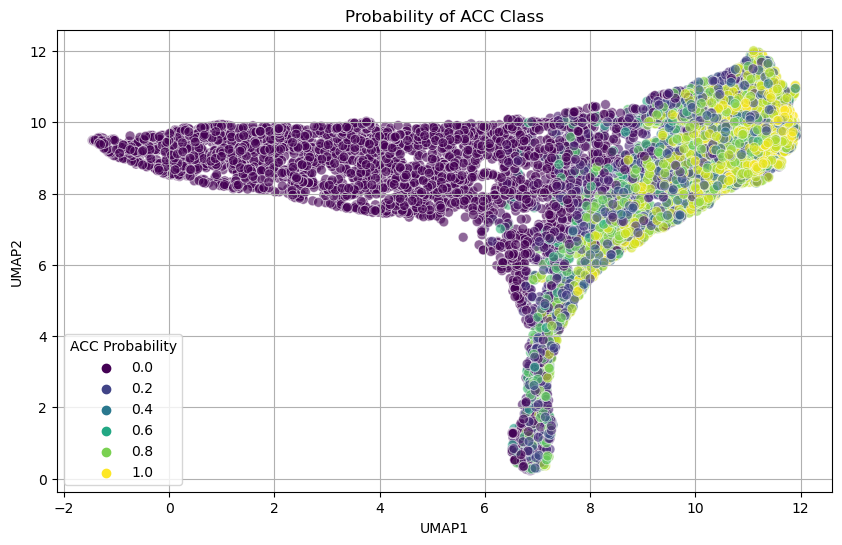

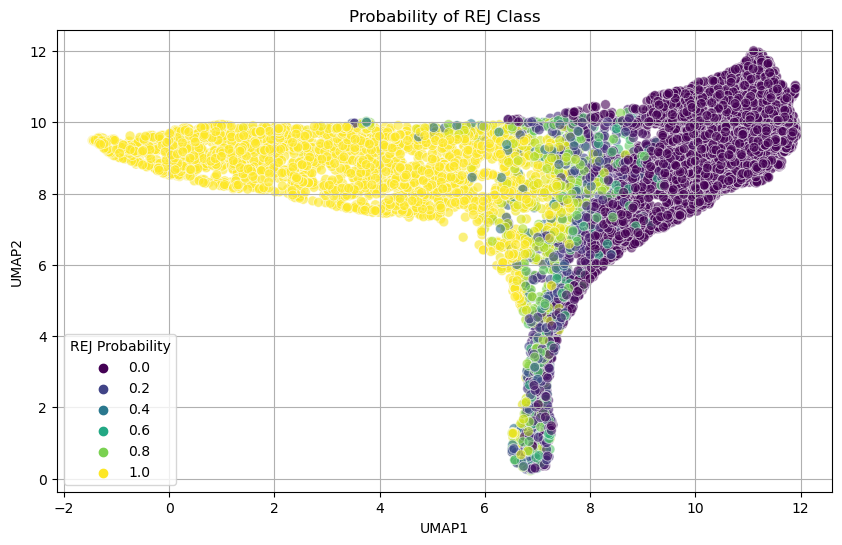

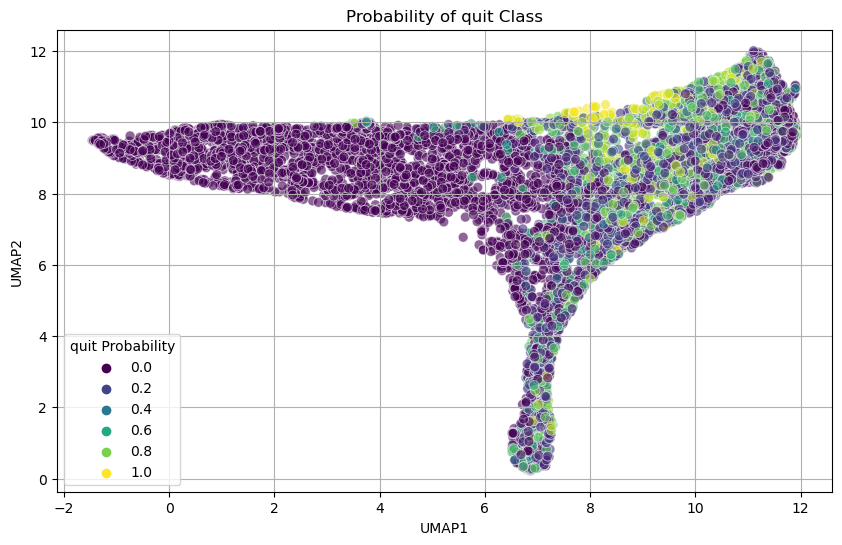

In [18]:
coords_umap_clean = coords_umap.dropna(subset=['UMAP1', 'UMAP2', 'sleap_decision'])

desired_decisions = ['ACC', 'REJ', 'quit']
coords_umap_filtered = coords_umap_clean[coords_umap_clean['sleap_decision'].isin(desired_decisions)]

X = coords_umap_filtered[['UMAP1', 'UMAP2']]
y = coords_umap_filtered['sleap_decision']

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)

probs = rf.predict_proba(X)
probs_df = pd.DataFrame(probs, columns=[f'{cls}_prob' for cls in rf.classes_])
coords_umap_filtered = pd.concat([coords_umap_filtered.reset_index(drop=True), probs_df], axis=1)

labels = rf.predict(X)
coords_umap_filtered['Predicted'] = labels

# Plot the probabilities for each class
for cls in rf.classes_:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='UMAP1', y='UMAP2', hue=f'{cls}_prob', data=coords_umap_filtered, palette='viridis', s=50, alpha=0.6, edgecolor='w')
    plt.title(f'Probability of {cls} Class')
    plt.xlabel('UMAP1')
    plt.ylabel('UMAP2')
    plt.legend(title=f'{cls} Probability')
    plt.grid(True)
    plt.show()

In [19]:
coords_umap_filtered.describe()

,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,x18,y18,x19,y19,x20,y20,x21,y21,x22,y22,x23,y23,x24,y24,x25,y25,x26,y26,x27,y27,x28,y28,x29,y29,x30,y30,x31,y31,x32,y32,straight_walking_speed,trial,restaurant,trial_length,UMAP1,UMAP2,UMAP3,UMAP4,UMAP5,ACC_prob,REJ_prob,quit_prob
count,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12214.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000,12222.000000
mean,287.477800,130.820676,288.014969,125.982164,288.496416,120.894600,288.979740,115.592480,289.470900,110.088306,289.967464,104.430861,290.461914,98.682741,290.944994,92.898949,291.423979,87.145009,291.910800,81.488451,292.433334,76.003308,292.996940,70.768489,293.615630,65.837838,294.269391,61.276382,294.934690,57.132580,295.586629,53.435502,296.211865,50.195220,296.794171,47.404507,297.309988,45.035832,297.762079,43.040561,298.154932,41.379096,298.476101,40.004824,298.704482,38.853469,298.809815,37.891450,298.772366,37.083032,298.590833,36.400417,298.234986,35.836999,297.710692,35.379544,297.012587,35.009013,296.161262,34.703978,295.178465,34.449553,294.073933,34.227440,168.994963,137.236213,2.481345,133.605138,7.810084,8.443579,3.240171,3.200330,5.037002,0.409329,0.355077,0.235594
std,6.938782,3.427368,6.718248,4.389898,6.545251,5.755589,6.386761,7.282760,6.235887,8.899572,6.103242,10.546925,5.985468,12.165479,5.885490,13.706497,5.809635,15.146332,5.793338,16.452788,5.844590,17.593089,5.928976,18.543081,6.122963,19.263302,6.442126,19.754172,6.929973,20.037108,7.631621,20.130515,8.577625,20.054734,9.780207,19.841298,11.219993,19.535591,12.869338,19.166772,14.682059,18.767827,16.647581,18.375485,18.756995,17.999826,20.990446,17.667413,23.354231,17.365245,25.793141,17.092902,28.288080,16.853920,30.822423,16.634453,33.400464,16.445651,35.993471,16.285006,38.581877,16.157776,41.163892,16.060168,43.041627,92.520368,1.119679,382.825603,3.345074,2.278592,2.141573,1.178947,0.762671,0.397258,0.448114,0.305821
min,256.878612,90.164377,257.245141,90.358030,257.859114,85.075759,258.594272,67.991634,258.652220,53.965762,259.429606,45.356313,259.384710,33.773744,259.962861,27.985515,259.795196,19.891633,259.181263,15.658620,257.936749,12.941759,257.127087,11.073267,256.986848,11.745250,257.658809,10.606140,259.188155,11.316766,259.539540,11.529039,254.952141,10.533825,247.761771,10.809882,240.090113,6.783586,230.970892,4.275408,221.976184,3.657966,211.602724,3.817625,200.992467,4.141928,190.818179,4.391591,181.090440,4.509483,171.966905,4.528215,162.792745,4.518063,154.932842,4.507770,147.548062,4.499281,142.255553,4.498509,140.254656,4.506929,138.913316,4.518892,0.000000,1.000000,1.000000,32.000000,-1.461311,0.219865,-0.355075,1.037161,3.132902,0.000000,0.000000,0.000000
25%,282.706212,128.177798,283.470691,123.129636,284.073066,116.971473,284.587111,111.071187,285.155998,104.256391,285.635083,97.477144,286.118115,90.417619,286.673714,83.492999,287.345611,76.868526,288.080121,70.452502,288.662422,64.099756,289.152316,58.173423,289.613592,52.807525,290.044995,47.601472,290.481046,43.375586,290.923435,39.941891,291.1621